# Housing Project : PRICE PREDICTION

Import the required modules

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
import sweetviz
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set_theme(style="darkgrid")

In [46]:
#Reading the train data
train_data=pd.read_csv('train.csv')

#Reading the test data
test_data=pd.read_csv('test.csv')

#To view all columns
pd.set_option('display.max_columns',None)

In [150]:
test_data.shape

(292, 80)

In [47]:
#Viewing the train data
train_data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,Gas

There are 1168 rows & 81 columns in the given train dataset

In [48]:
#Brief info of the data
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

From above we can see the details like: Number of non missing values, and data types

In [49]:
#Dropping the column ID and reading data into new variable
df=train_data.drop('Id',axis=1)

In [50]:
#Exploring number of unique values in each column
df.nunique()

MSSubClass        15
MSZoning           5
LotFrontage      106
LotArea          892
Street             2
Alley              2
LotShape           4
LandContour        4
Utilities          1
LotConfig          5
LandSlope          3
Neighborhood      25
Condition1         9
Condition2         8
BldgType           5
HouseStyle         8
OverallQual       10
OverallCond        9
YearBuilt        110
YearRemodAdd      61
RoofStyle          6
RoofMatl           8
Exterior1st       14
Exterior2nd       15
MasVnrType         4
MasVnrArea       283
ExterQual          4
ExterCond          5
Foundation         6
BsmtQual           4
BsmtCond           4
BsmtExposure       4
BsmtFinType1       6
BsmtFinSF1       551
BsmtFinType2       6
BsmtFinSF2       122
BsmtUnfSF        681
TotalBsmtSF      636
Heating            6
HeatingQC          5
CentralAir         2
Electrical         5
1stFlrSF         669
2ndFlrSF         351
LowQualFinSF      21
GrLivArea        746
BsmtFullBath       4
BsmtHalfBath 

In [51]:
#Number of missing values in each column
pd.set_option('display.max_rows',None)
df.isnull().sum()

MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea 

we can see there are many columns with missing values. Let us fix this issue first

In [52]:
col=df.columns
s=0
for i in col:
    n=df[i].isnull().sum()
    if  n > 0 :
        print(i,n)
        s=s+1
print('\nTotal number of columns with missing values:',s)    

LotFrontage 214
Alley 1091
MasVnrType 7
MasVnrArea 7
BsmtQual 30
BsmtCond 30
BsmtExposure 31
BsmtFinType1 30
BsmtFinType2 31
FireplaceQu 551
GarageType 64
GarageYrBlt 64
GarageFinish 64
GarageQual 64
GarageCond 64
PoolQC 1161
Fence 931
MiscFeature 1124

Total number of columns with missing values: 18


We can see there are 18 columns with missing values. Let us explore each column and decide how to fill missing values in each column

#### LotFrontage : Linear feet of street connected to property

In [53]:
df['LotFrontage'].unique()

array([ nan,  95.,  92., 105.,  58.,  88.,  70.,  80.,  50.,  44., 129.,
        59.,  55.,  64.,  24.,  68.,  71.,  74.,  61.,  60., 120.,  84.,
       141.,  30.,  65.,  76., 100.,  85.,  75., 107., 122.,  82.,  62.,
        73.,  79.,  77.,  41.,  69.,  90.,  96.,  72.,  34.,  78.,  63.,
        40.,  98., 160., 108., 128.,  51.,  81.,  99.,  66.,  37., 174.,
        87.,  53., 152.,  47.,  86.,  56.,  89.,  35.,  52.,  21., 104.,
        57.,  83.,  46., 101., 112., 149.,  93.,  49.,  43., 130.,  54.,
        91.,  67.,  97., 110., 103., 115.,  94.,  48.,  36., 313., 109.,
       144., 121., 102., 116., 182.,  32.,  42., 168., 118.,  38., 140.,
       134., 114., 124.,  39., 111.,  45., 106., 153.])

Based on the column description and observing the values, I am assuming that the values are nan since there is no LotFrontage. Therefore I am replacing the nan values with 0 in this column 

In [54]:
#Filling nan with 0
df['LotFrontage'].fillna(0,inplace=True)

We filled the nan values in column LotFrontage with 0

In [55]:
#Checking for missing values
df['LotFrontage'].isnull().sum()

0

Now there are no missing values

#### Alley : Type of alley access to property

In [56]:
df['Alley'].unique()

array([nan, 'Grvl', 'Pave'], dtype=object)

In [57]:
df['Alley'].value_counts()

Grvl    41
Pave    36
Name: Alley, dtype: int64

There are 3 unique values, where nan means no alley access. So i am filling nan values with No alley access

In [58]:
#Filled null values with No alley access
df['Alley'].fillna('No alley access',inplace=True)

In [59]:
#Checking for missing values
df['Alley'].isnull().sum()

0

Now there are no null values

#### MasVnrType : Masonry veneer type

In [60]:
#Checking unique values
df['MasVnrType'].unique()

array(['None', 'BrkFace', 'Stone', 'BrkCmn', nan], dtype=object)

In [61]:
#No of counts of each value
df['MasVnrType'].value_counts()

None       696
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64

There are only 7 missing values, we can fill these by comparing with price ,or with mode or by assuming they are left blank due to none 

In [62]:
#Filling null values as nan inorder to compare prices
df['MasVnrType'].fillna('nan',inplace=True)

<AxesSubplot:xlabel='MasVnrType', ylabel='SalePrice'>

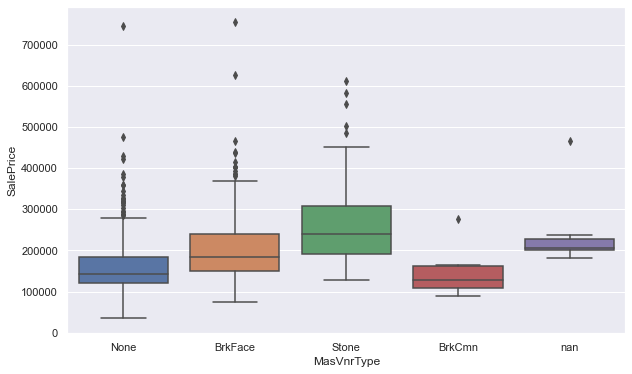

In [63]:
plt.figure(figsize=(10,6))
sns.boxplot(x=df['MasVnrType'],y=df['SalePrice'])

From graph we can see the nan values price is more than 75% of none value ones. So i am assuming these values as BrkFace and fill them with BrkFace

In [64]:
df['MasVnrType'].replace('nan','BrkFace',inplace=True)

#### MasVnrArea : Masonry veneer area in sq.ft

In [65]:
df['MasVnrArea'].describe()

count    1161.000000
mean      102.310078
std       182.595606
min         0.000000
25%         0.000000
50%         0.000000
75%       160.000000
max      1600.000000
Name: MasVnrArea, dtype: float64

There are only 7 rows with missing data. from statistical observation  we can see mean > median and skewness is present. So i am filling these with median

In [66]:
df['MasVnrArea'].fillna(df['MasVnrArea'].median(),inplace=True)

filled the missing values with median

In [67]:
#Checking for missing values
df['MasVnrArea'].isnull().sum()

0

No missing values now.

#### BsmtQual : Evalutes the height of basement

It is given in description of column, that Na representsno basement. So filling nan with No basement

In [68]:
df['BsmtQual'].unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [69]:
df['BsmtQual'].value_counts()

TA    517
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64

In [70]:
df['BsmtQual'].fillna('NA',inplace=True)

Filled the missing values as NA - which represents no basement.But typically basement is must. So we will compare with prices and replace this NA with relevant type

<AxesSubplot:xlabel='SalePrice', ylabel='BsmtQual'>

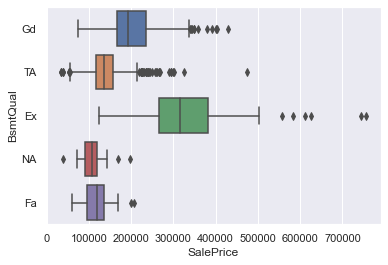

In [71]:
sns.boxplot(df['SalePrice'],df['BsmtQual'])

No missing values now.

#### BsmtCond : Evaluates condition of Basement

In [72]:
print(df['BsmtCond'].unique())
df['BsmtCond'].value_counts()

['TA' 'Gd' 'Fa' nan 'Po']


TA    1041
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64

I am assuming it is left blank since there is no basement.

In [73]:
df['BsmtCond'].fillna('NA',inplace=True)

Filled missing values with NA : that represents No Basement

#### BsmtExposure : Refers to walkout or garden level walls

In [74]:
df['BsmtExposure'].unique()

array(['No', 'Gd', 'Av', 'Mn', nan], dtype=object)

In [75]:
df['BsmtExposure'].value_counts()

No    756
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64

From given details, left blank if there is no basement. So filling the missing values with NA 

In [76]:
df['BsmtExposure'].fillna('NA',inplace=True)

Filled nan values with NA

#### BsmtFinType1 : Rating of basement finshed area

In [77]:
df['BsmtFinType1'].value_counts()

Unf    345
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64

Filling missing values with NA

In [78]:
df['BsmtFinType1'].fillna('NA',inplace=True)

#### BsmtFinType2 : Rating of basement finshed area (If multiples)

In [79]:
df['BsmtFinType2'].value_counts()

Unf    1002
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64

In [80]:
df['BsmtFinType2'].fillna('NA',inplace=True)

#### FireplaceQu : Quality of Fireplace

In [81]:
df['FireplaceQu'].value_counts()

Gd    301
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64

If number of fireplaces is 0, we will fill it with NA else we will fill it with mode. 

In [82]:
x=df[df['Fireplaces']==0]

In [83]:
x.loc[:,['Fireplaces','FireplaceQu']]

,Fireplaces,FireplaceQu
8,0,NaN
9,0,NaN
12,0,NaN
13,0,NaN
14,0,NaN
16,0,NaN
17,0,NaN
19,0,NaN
21,0,NaN
22,0,NaN


In [84]:
len(x)

551

we can see NaN is present wherever there is no fireplace.So we will fill these missing values with NA

In [85]:
df['FireplaceQu'].fillna('NA',inplace=True)

#### GarageType : Garage Location

In [86]:
df['GarageType'].value_counts()

Attchd     691
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64

Given when there is no garrage, it is left blank.

In [87]:
df['GarageType'].fillna('NA',inplace=True)

#### GarageYrBlt: Year Garrage was built

wherever there is no garrage, then it should be blank. we will check and verify before filling as NA

In [88]:
x=df[df['GarageType']=='NA']

In [89]:
x.loc[:,['GarageType','GarageYrBlt']]

,GarageType,GarageYrBlt
48,NA,NaN
72,NA,NaN
74,NA,NaN
105,NA,NaN
116,NA,NaN
123,NA,NaN
127,NA,NaN
149,NA,NaN
180,NA,NaN
184,NA,NaN


In [90]:
len(x)

64

Confirmed that , wherever there is no garrage, there it is left blank. So we will fill this with 0

In [91]:
df['GarageYrBlt'].fillna(0,inplace=True)

In [92]:
from datetime import date
current_date= date.today()
current_year=current_date.year
current_year

2022

In [93]:
#For better info , we will change the yrbltinfo to number of years old from current year
df['GarageYrBlt']=current_year-df['GarageYrBlt']

Now this info will give better info

#### GarageFinish, GarageQual , GarageCond - 

In [94]:
x.loc[:,['GarageType','GarageFinish','GarageQual','GarageCond']]

,GarageType,GarageFinish,GarageQual,GarageCond
48,NA,NaN,NaN,NaN
72,NA,NaN,NaN,NaN
74,NA,NaN,NaN,NaN
105,NA,NaN,NaN,NaN
116,NA,NaN,NaN,NaN
123,NA,NaN,NaN,NaN
127,NA,NaN,NaN,NaN
149,NA,NaN,NaN,NaN
180,NA,NaN,NaN,NaN
184,NA,NaN,NaN,NaN


we can see there are missing values wherever there is no garrage only, so we will fill with NA

In [95]:
co=['GarageQual','GarageFinish','GarageCond']
for c in co:
    df[c].fillna('NA',inplace=True)

Filled in these 3 columns with NA

In [96]:
co=['GarageQual','GarageFinish','GarageCond']
for c in co:
    print(df[c].isnull().sum())

0
0
0


#### PoolQC: Pool quality condition

In [97]:
df['PoolQC'].value_counts()

Gd    3
Ex    2
Fa    2
Name: PoolQC, dtype: int64

In [98]:
df.shape

(1168, 80)

We can see many properties doesn't have pool, so i am dropping this column

In [99]:
df.drop('PoolQC',axis=1,inplace=True)

In [100]:
1161/1168

0.9940068493150684

dropped the column, since 99% of the houses doesn't have pool

#### MiscFeature : Miscellaneous features not covered in other fields

In [101]:
1124/1168

0.9623287671232876

we can drop this column, since 96% of houses doesnt have

In [102]:
df.drop('MiscFeature',axis=1,inplace=True)

#### Fence : Fence Quality

it is given , there is no fence if left blank

In [103]:
df['Fence'].fillna('NA',inplace=True)

Filled missing values with NA

Checking now any missing values in any column

In [104]:
col=df.columns
s=0
for i in col:
    n=df[i].isnull().sum()
    if  n > 0 :
        print(i,n)
        s=s+1
        
print('\nTotal number of columns with missing values:',s)    


Total number of columns with missing values: 0


We can see,now there are no missing values

### Exploring each column

MsSubClass : Identifies the type of dwelling involved in the sale.

In [105]:
#No.of unique values
df['MSSubClass'].nunique()

15

There are 15 unique values 

In [106]:
#Viewing the unique values
df['MSSubClass'].unique()

array([120,  20,  60,  50,  70,  30, 160,  85,  45,  90,  40,  80, 190,
        75, 180], dtype=int64)

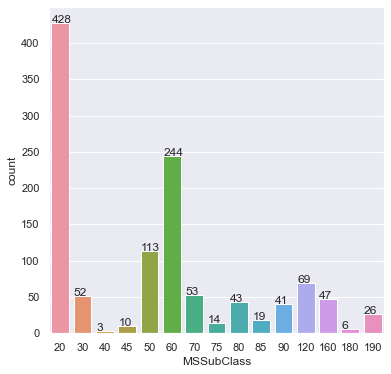

In [107]:
#Let us see the count of each value in this column
plt.figure(figsize=(6,6))
ax=sns.countplot(df['MSSubClass'])
for p in ax.patches:
   ax.annotate(p.get_height(),(p.get_x()+0.01, p.get_height()+0.01))

Making other instance of data

In [108]:
df1=df.copy(deep=True)

In [109]:
#Brief statistics of dataset
df1.describe(include='all')

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1168.000000,1168,1168.000000,1168.000000,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168.000000,1168.000000,1168.000000,1168.000000,1168,1168,1168,1168,1168,1168.000000,1168,1168,1168,1168,1168,1168,1168,1168.000000,1168,1168.000000,1168.000000,1168.000000,1168,1168,1168,1168,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168,1168.000000,1168,1168.000000,1168,1168,1168.000000,1168,1168.000000,1168.000000,1168,1168,1168,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168,1168.000000,1168.000000,1168.000000,1168,1168,1168.000000
unique,NaN,5,NaN,NaN,2,3,4,4,1,5,3,25,9,8,5,8,NaN,NaN,NaN,NaN,6,8,14,15,4,NaN,4,5,6,5,5,5,7,NaN,7,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,6,7,NaN,4,NaN,NaN,6,6,3,NaN,NaN,NaN,NaN,NaN,NaN,5,NaN,NaN,NaN,9,6,NaN
top,NaN,RL,NaN,NaN,Pave,No alley access,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,CBlock,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,NA,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,NA,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,928,NaN,NaN,1164,1091,740,1046,1168,842,1105,182,1005,1154,981,578,NaN,NaN,NaN,NaN,915,1144,396,387,696,NaN,717,1022,516,517,1041,756,345,NaN,1002,NaN,NaN,NaN,1143,585,1090,1070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,578,NaN,1085,NaN,551,691,NaN,487,NaN,NaN,1050,1061,1071,NaN,NaN,NaN,NaN,NaN,NaN,931,NaN,NaN,NaN,999,945,NaN
mean,56.767979,NaN,57.982021,10484.749144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.104452,5.595890,1970.930651,1984.758562,NaN,NaN,NaN,NaN,NaN,101.696918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,444.726027,NaN,46.647260,569.721747,1061.095034,NaN,NaN,NaN,NaN,1169.860445,348.826199,6.380137,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,NaN,6.542808,NaN,0.617295,NaN,NaN,152.200342,NaN,1.776541,476.860445,NaN,NaN,NaN,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,NaN,47.315068,6.344178,2007.804795,NaN,NaN,181477.005993
std,41.940650,NaN,35.471226,8957.442311,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.390153,1.124343,30.145255,20.785185,NaN,NaN,NaN,NaN,NaN,182.218483,NaN,NaN,NaN,NaN,NaN,NaN,NaN,462.664785,NaN,163.520016,449.375525,442.272249,NaN,NaN,NaN,NaN,391.161983,439.696370,50.892844,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,NaN,1.598484,NaN,0.650575,NaN,NaN,451.037303,NaN,0.745554,214.466769,NaN,NaN,NaN,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,NaN,543.264432,2.686352,1.329738,NaN,NaN,79105.586863
min,20.000000,NaN,0.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1875.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,12.000000,NaN,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,1.000000,20

In [110]:
#Seperating all categorical columns
categorical = df1.select_dtypes(include='object')

Finding the value counts in columns, if any having only one variety

In [111]:
for c in categorical.columns:
    count=df1[c].nunique()
    if count == 1:
        print(c,count)

Utilities 1


there is only one column, utilities with 1 value

In [112]:
df1['Utilities'].unique()

array(['AllPub'], dtype=object)

the value is Allpub, i.e all services are available for all the propertiesin the data. So we can drop this column

In [113]:
df1.drop('Utilities', axis=1,inplace=True)

So before encoding, we will merge test dataset to make sure encoded correctly and drop them.

In [114]:
df2=pd.DataFrame({})
cols=df1.columns
cols=cols[:-1]
for i in cols:
    df2[i]=test_data[i]
df2

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,RL,86.0,14157,Pave,NaN,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,0,7,2007,WD,Normal
1,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,0,8,2009,COD,Abnorml
2,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,0,6,2009,WD,Normal
3,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,0,7,2009,WD,Normal
4,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,0,1,2008,WD,Normal
5,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,MnPrv,0,12,2007,WD,Normal
6,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,0,5,2006,WD,Normal
7,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,0,1,2008,New,Partial
8,80,RL,NaN,12800,Pave,NaN,Reg,Low,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,0,8,2009,WD,Normal
9,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,Y,0,247,0,0,0,0,NaN,0,6,2009,WD,Normal


In [115]:
df2.fillna('NA',inplace=True)

In [116]:
#Adding new column to identify columns train or test data
df1['data']='train'
df2['data']='test'

In [117]:
#changing the year values to number of years old

yr_cols = ['YrSold','YearBuilt','YearRemodAdd']
for i in yr_cols:
    df2[i]=current_year-df2[i]
    
for i in yr_cols:
    if i == 'YrSold':
        pass
    else:
        df1[i]=current_year-df1[i]

Now joining the two df1 & df2

In [118]:
ds=pd.concat([df1,df2],ignore_index=True)

In [119]:
cate = df1.select_dtypes(include='object')

In [120]:
#Encoding all other features
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

cate = df1.select_dtypes(include='object')
for c in cate.columns:
    if c == 'data':
        pass
    else:
        ds[c]=le.fit_transform(ds[c])
    
ds

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,data
0,120,3,0.0,4928,1,2,0,3,4,0,13,2,2,4,2,6,5,46,46,1,1,9,10,3,0.0,3,4,1,2,4,4,0,120,6,0,958,1078,1,4,1,5,958,0,0,958,0,0,2,0,2,1,3,5,6,1,5,1,45.0,2,2,440,5,5,2,0,205,0,0,0,0,4,0,2,2007,8,4,128000.0,train
1,20,3,95.0,15865,1,2,0,3,4,1,12,2,2,0,2,8,6,52,52,0,5,13,14,3,0.0,2,2,2,4,1,1,0,351,5,823,1043,2217,1,0,1,5,2217,0,0,2217,1,0,2,0,4,1,2,8,6,1,5,1,52.0,3,2,621,5,5,2,81,207,0,0,224,0,4,0,10,2007,8,4,268000.0,train
2,60,3,92.0,9920,1,2,0,3,1,0,15,2,2,0,5,7,5,26,25,1,1,8,8,3,0.0,2,4,2,2,4,0,2,862,6,0,255,1117,1,0,1,5,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,5,1,25.0,3,2,455,5,5,2,180,130,0,0,0,0,4,0,6,2007,8,4,269790.0,train
3,20,3,105.0,11751,1,2,0,3,4,0,14,2,2,0,2,6,6,45,45,3,1,9,10,1,480.0,3,4,1,2,4,4,1,705,6,0,1139,1844,1,0,1,5,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,5,1,45.0,2,2,546,5,5,2,0,122,0,0,0,0,2,0,1,2010,0,4,190000.0,train
4,20,3,0.0,16635,1,2,0,3,2,0,14,2,2,0,2,6,7,45,22,1,1,5,5,4,126.0,2,4,1,2,4,4,0,1246,6,0,356,1602,1,2,1,5,1602,0,0,1602,0,1,2,0,3,1,2,8,6,1,5,1,45.0,0,2,529,5,5,2,240,0,0,0,0,0,4,0,6,2009,8,4,215000.0,train
5,60,3,58.0,14054,1,2,0,3,4,0,8,2,2,0,5,7,5,16,16,1,1,12,13,3,0.0,2,4,2,2,4,0,6,0,6,0,879,879,1,0,1,5,879,984,0,1863,0,0,2,1,4,1,2,9,6,1,2,3,16.0,0,3,660,5,5,2,100,17,0,0,0,0,4,0,11,2006,6,5,219210.0,train
6,20,3,0.0,11341,1,2,0,3,4,0,19,2,2,0,2,5,6,65,26,3,1,13,14,1,180.0,3,4,1,2,4,4,0,1302,6,0,90,1392,1,4,1,5,1392,0,0,1392,1,0,1,1,3,1,3,5,4,1,2,5,65.0,3,2,528,5,5,2,0,0,0,0,95,0,4,0,5,2010,8,4,121500.0,train
7,20,3,88.0,13125,1,2,3,3,0,0,19,2,2,0,2,5,4,65,22,1,1,13,14,0,67.0,3,4,1,4,4,4,5,168,1,682,284,1134,1,0,1,5,1803,0,0,1803,1,0,2,0,3,1,3,8,0,1,5,1,65.0,2,2,484,5,5,2,0,0,0,0,0,0,0,0,1,2006,8,4,155000.0,train
8,20,3,70.0,9170,1,2,3,3,0,0,7,1,2,0,2,5,7,57,57,3,1,8,8,3,0.0,3,4,1,4,4,4,0,698,2,96,420,1214,1,0,1,5,1214,0,0,1214,1,0,1,0,2,1,3,6,6,0,3,5,57.0,3,2,461,1,1,2,0,0,184,0,0,0,0,400,4,2007,8,4,140000.0,train
9,50,3,80.0,8480,1,2,3,3,4,0,12,2,2,0,0,5,5,75,72,1,1,8,8,3,0.0,3,4,1,4,4,4,5,442,6,0,390,832,1,4,1,5,832,384,0,1216,0,0,1,0,2,1,3,6,6,0,3,5,75.0,3,1,336,5,5,2,158,0,102,0,0,0,4,0,10,2008,0,0,118500.0,train


In [121]:
ds.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'O

In [122]:
#Splitting the train & test datasets
train_dt = ds[ds['data']=='train']
test_dt = ds[ds['data']=='test']

In [123]:
train_dt.shape

(1168, 78)

In [124]:
test_dt.shape

(292, 78)

verified no. of rows

In [125]:
#Dropping the column data from both the datasets
train_dt.drop('data',axis=1,inplace=True)
test_dt.drop(['SalePrice','data'],axis=1,inplace=True)

MSSubClass          AxesSubplot(0.125,0.840263;0.133621x0.0397368)
MSZoning         AxesSubplot(0.285345,0.840263;0.133621x0.0397368)
LotFrontage       AxesSubplot(0.44569,0.840263;0.133621x0.0397368)
LotArea          AxesSubplot(0.606034,0.840263;0.133621x0.0397368)
Street           AxesSubplot(0.766379,0.840263;0.133621x0.0397368)
Alley               AxesSubplot(0.125,0.792579;0.133621x0.0397368)
LotShape         AxesSubplot(0.285345,0.792579;0.133621x0.0397368)
LandContour       AxesSubplot(0.44569,0.792579;0.133621x0.0397368)
LotConfig        AxesSubplot(0.606034,0.792579;0.133621x0.0397368)
LandSlope        AxesSubplot(0.766379,0.792579;0.133621x0.0397368)
Neighborhood        AxesSubplot(0.125,0.744895;0.133621x0.0397368)
Condition1       AxesSubplot(0.285345,0.744895;0.133621x0.0397368)
Condition2        AxesSubplot(0.44569,0.744895;0.133621x0.0397368)
BldgType         AxesSubplot(0.606034,0.744895;0.133621x0.0397368)
HouseStyle       AxesSubplot(0.766379,0.744895;0.133621x0.0397

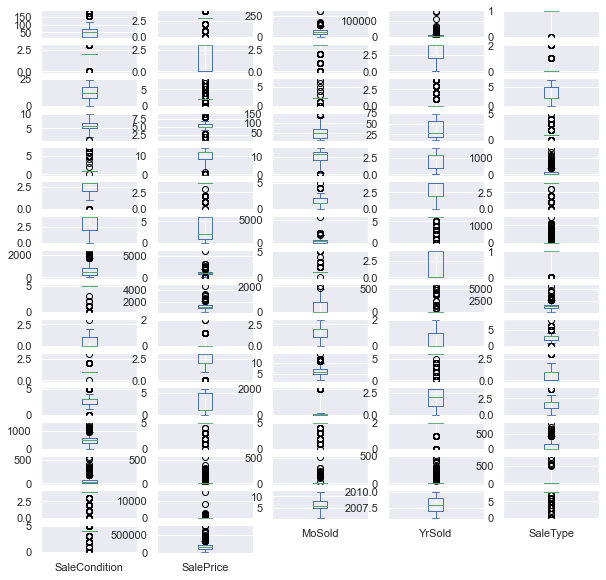

In [126]:
#exploring train_dt
#Viewing the presence of outliers
train_dt.plot(kind='box',subplots=True,figsize=(10,10),layout=(16,5))

In [127]:
#Checking the skewness
train_dt.skew()

MSSubClass        1.422019
MSZoning         -1.796785
LotFrontage       0.364916
LotArea          10.659285
Street          -17.021969
Alley            -3.293268
LotShape         -0.603775
LandContour      -3.125982
LotConfig        -1.118821
LandSlope         4.812568
Neighborhood      0.043735
Condition1        3.008289
Condition2       11.514458
BldgType          2.318657
HouseStyle        0.285680
OverallQual       0.175082
OverallCond       0.580714
YearBuilt         0.579204
YearRemodAdd      0.495864
RoofStyle         1.498560
RoofMatl          7.577352
Exterior1st      -0.750566
Exterior2nd      -0.699672
MasVnrType       -0.553573
MasVnrArea        2.835718
ExterQual        -1.810843
ExterCond        -2.516219
Foundation       -0.002761
BsmtQual         -0.487530
BsmtCond         -2.816444
BsmtExposure     -0.960565
BsmtFinType1      0.100811
BsmtFinSF1        1.871606
BsmtFinType2     -3.144813
BsmtFinSF2        4.365829
BsmtUnfSF         0.909057
TotalBsmtSF       1.744591
H

In categorical values, skewness no need to be rectified. In numerical columns only we need to decrease skewness. 

In [128]:
num_col=df1.select_dtypes(exclude='object').columns

In [129]:
num_col

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [130]:
#Viewing the skewness in numerical value columns which are not in acceptable range.
for col in num_col:
    skewness=train_dt[col].skew()
    if skewness > 5 or skewness < -5:
        print(col, skewness)

LotArea 10.659284548299626
LowQualFinSF 8.666142302049042
3SsnPorch 9.770611216755274
PoolArea 13.243710763499866
MiscVal 23.065942802581013


In [131]:
#Fixing the skewness: 
skew_co=['LotArea','LowQualFinSF','3SsnPorch','PoolArea','MiscVal']

#To check whether it have 0 in them 
train_dt[skew_co].describe()

,LotArea,LowQualFinSF,3SsnPorch,PoolArea,MiscVal
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,10484.749144,6.380137,3.639555,3.448630,47.315068
std,8957.442311,50.892844,29.088867,44.896939,543.264432
min,1300.000000,0.000000,0.000000,0.000000,0.000000
25%,7621.500000,0.000000,0.000000,0.000000,0.000000
50%,9522.500000,0.000000,0.000000,0.000000,0.000000
75%,11515.500000,0.000000,0.000000,0.000000,0.000000
max,164660.000000,572.000000,508.000000,738.000000,15500.000000


We can see there are 0 , i.e no particular thing. For removing skewness i there is 0,it wont work. So we use salting method. to remove

In [132]:
for i in skew_co:
    if i == 'LotArea':
        pass
    else:
        train_dt[i]=0.01+train_dt[i]

In [133]:
#Fixing the skewness: 
skew_co=['LotArea','LowQualFinSF','3SsnPorch','PoolArea','MiscVal']

#To check whether it have 0 in them 
train_dt[skew_co].describe()

,LotArea,LowQualFinSF,3SsnPorch,PoolArea,MiscVal
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,10484.749144,6.390137,3.649555,3.458630,47.325068
std,8957.442311,50.892844,29.088867,44.896939,543.264432
min,1300.000000,0.010000,0.010000,0.010000,0.010000
25%,7621.500000,0.010000,0.010000,0.010000,0.010000
50%,9522.500000,0.010000,0.010000,0.010000,0.010000
75%,11515.500000,0.010000,0.010000,0.010000,0.010000
max,164660.000000,572.010000,508.010000,738.010000,15500.010000


In [134]:
#Now we can apply log transformation to overcome skewness
train_dt['LotArea']=np.log(train_dt['LotArea'])

In [135]:
train_dt['LowQualFinSF']=np.log(train_dt['LowQualFinSF'])

In [136]:
train_dt['3SsnPorch']=np.log(train_dt['3SsnPorch'])

In [137]:
train_dt['PoolArea']=np.log(train_dt['PoolArea'])

In [138]:
train_dt['MiscVal']=np.log(train_dt['MiscVal'])

In [139]:
#Skewness after reduction
for i in skew_co:
    print(i,train_dt[i].skew())

LotArea -0.16967981002018756
LowQualFinSF 6.976729207636998
3SsnPorch 7.121515266540344
PoolArea 12.820509358358983
MiscVal 5.04874516583982


We can see the skewness is reduced.

<AxesSubplot:>

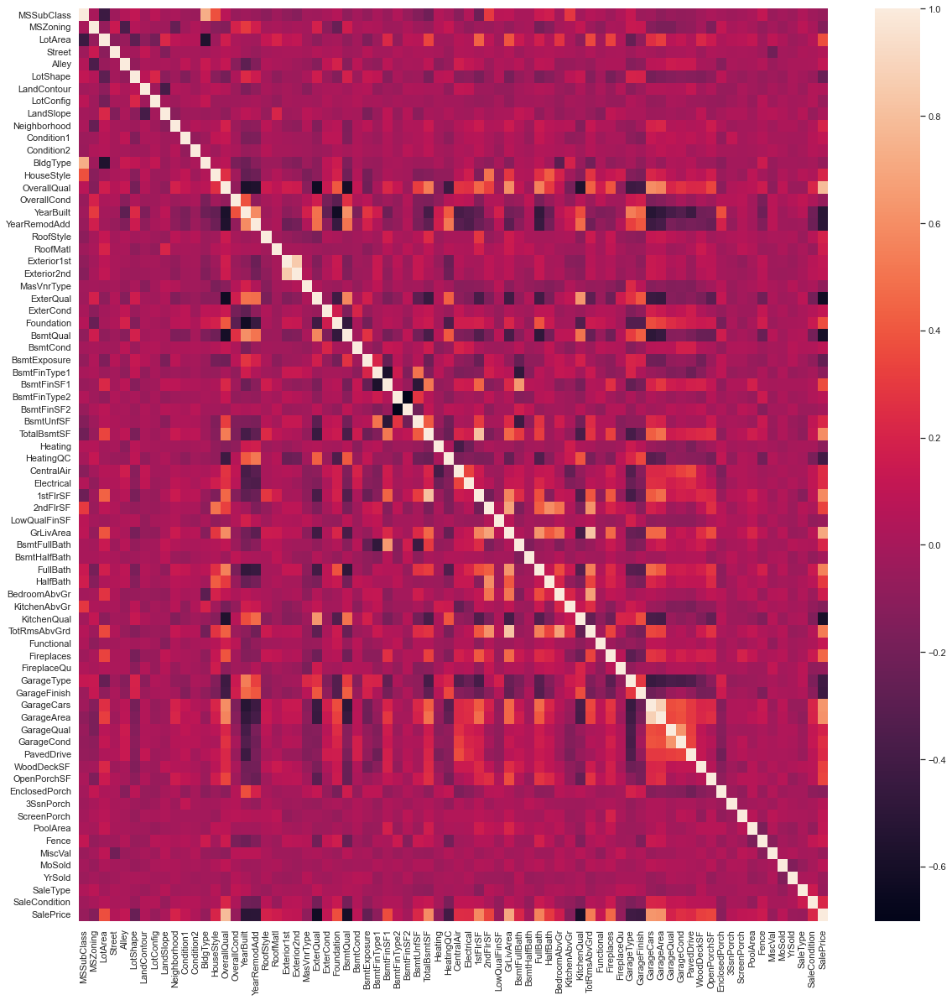

In [140]:
#Seeing the correlation
plt.figure(figsize=(20,20))
sns.heatmap(train_dt.corr())

From above we can't get clear idea or analyze

In [141]:
x=train_dt.drop('SalePrice',axis=1)
y=train_dt['SalePrice']

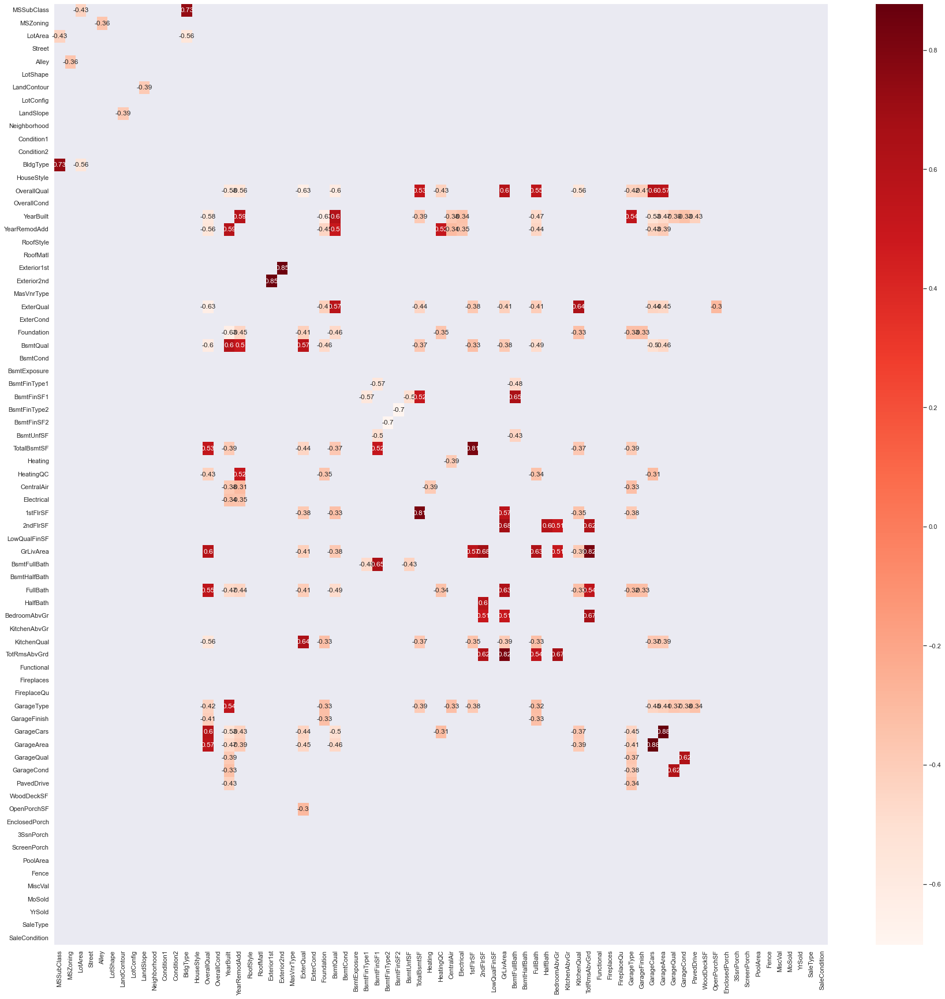

In [142]:
corr_matrix = x.corr()
threshold = 0.5
filtered_corr_df = corr_matrix[(corr_matrix >= threshold) & (corr_matrix != 1.000) | (corr_matrix <= -0.3)] 

plt.figure(figsize=(30,30))
sns.heatmap(filtered_corr_df, annot=True, cmap="Reds")
plt.show()

Now we can see the columns which are having corr of 0.5 and above.

In [143]:
#Dropping the columns with high correlation
def correlation(data, threshold):
    global col_corr
    col_corr = []
    corr_matrix = data.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if corr_matrix.iloc[i,j] > threshold:
                col_name = corr_matrix.columns[i]
                col_corr.append(col_name)
    return col_corr

In [144]:
correlation(x, 0.5)

['BldgType',
 'YearRemodAdd',
 'Exterior2nd',
 'BsmtQual',
 'BsmtQual',
 'BsmtQual',
 'TotalBsmtSF',
 'TotalBsmtSF',
 'HeatingQC',
 '1stFlrSF',
 'GrLivArea',
 'GrLivArea',
 'GrLivArea',
 'BsmtFullBath',
 'FullBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'BedroomAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'TotRmsAbvGrd',
 'TotRmsAbvGrd',
 'TotRmsAbvGrd',
 'GarageType',
 'GarageCars',
 'GarageArea',
 'GarageArea',
 'GarageCond']

All the above columns have high correlation , more than 0.5. 

In [145]:
#Dropping the columns with high correlation
x.drop(col_corr,axis=1,inplace=True)

In [146]:
test_dt.drop(col_corr, axis=1,inplace=True)

In [147]:
x.shape

(1168, 58)

In [148]:
test_dt.shape

(292, 58)

In [149]:
#Scaling the data
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x_scaled = sc.fit_transform(x)

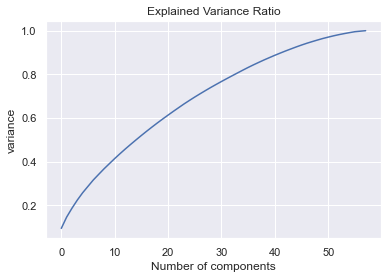

In [234]:
#PCA
from sklearn.decomposition import PCA
pca = PCA()
principalcomponents = pca.fit_transform(x_scaled)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained Variance Ratio')
plt.xlabel('Number of components')
plt.ylabel ('variance')
plt.show()

we can see that 45 components are having 95% of variance

In [235]:
pca = PCA(n_components = 45)
pca_x = pca.fit_transform(x_scaled)

In [236]:
from sklearn.model_selection import train_test_split 
from sklearn.metrics import r2_score,mean_squared_error, mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor

In [237]:
#Splitting into train and test
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.25,random_state=45)

In [240]:
from sklearn.model_selection import cross_val_score
ml_models=[LinearRegression(),SVR(),RandomForestRegressor(),GradientBoostingRegressor()]
for m in ml_models:
    m.fit(x_train,y_train)
    predm=m.predict(x_test)
    mse=mean_squared_error(y_test,predm)
    mae=mean_absolute_error(y_test,predm)
    r2=r2_score(y_test,predm)
    print(f'metrics of {m}:')
    print('Training score:', m.score(x_train,y_train))
    print('Testing Score:',m.score(x_test,y_test))
    print(f' mean_absolute_error: {mae}\n mean_squared_error: {mse}\n r2_score: {r2} ')
    score=cross_val_score(m,x_scaled,y, cv=5)
    print(' mean cv score:',score.mean())
    print('**'*20 , '\n')

metrics of LinearRegression():
Training score: 0.8457180250814662
Testing Score: 0.5960727847377936
 mean_absolute_error: 24845.1792482903
 mean_squared_error: 2752626456.402911
 r2_score: 0.5960727847377936 
 mean cv score: 0.7216312376830656
**************************************** 

metrics of SVR():
Training score: -0.05591064704062787
Testing Score: -0.030699741451764906
 mean_absolute_error: 55381.5052683813
 mean_squared_error: 7023867839.868291
 r2_score: -0.030699741451764906 
 mean cv score: -0.062075842649206917
**************************************** 

metrics of RandomForestRegressor():
Training score: 0.9723800873270745
Testing Score: 0.8146833797764066
 mean_absolute_error: 22123.050787671233
 mean_squared_error: 1262869676.427971
 r2_score: 0.8146833797764066 
 mean cv score: 0.82012116876287
**************************************** 

metrics of GradientBoostingRegressor():
Training score: 0.9589896630742526
Testing Score: 0.8363903995266035
 mean_absolute_error: 20145

Gradient boosting regressor is giving good accuracy. Least difference between r2score and cv score. Also the model is bit overfit.

Selecting Gradient Boosting as my best model

In [241]:
#Makikng the model
gbr=GradientBoostingRegressor()
gbr.fit(x_train,y_train)
pred=gbr.predict(x_test)
mse=mean_squared_error(y_test,pred)
mae=mean_absolute_error(y_test,pred)
r2=r2_score(y_test,pred)
print(f' mean_absolute_error: {mae}\n mean_squared_error: {mse}\n r2_score: {r2} ')

 mean_absolute_error: 20269.935780751886
 mean_squared_error: 1085770618.2214737
 r2_score: 0.8406713336596918 


<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

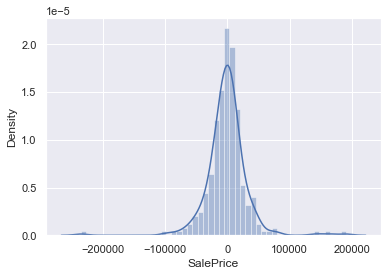

In [242]:
sns.distplot(y_test-pred)

In [243]:
#Tuning
from sklearn.model_selection import GridSearchCV
par={'n_estimators':range(100,1000,100),
     'min_samples_split':range(2,10,2),
     'min_samples_leaf':range(1,10)
    }
grid=GridSearchCV(gbr,param_grid=par, cv=5,verbose=2,n_jobs=1)
grid.fit(x_train,y_train)
print(grid.best_score_)
print(grid.best_estimator_)
print(grid.best_params_)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV] END min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END min_samples_leaf=1, min_samples_split=2, n_estimators=300

[CV] END min_samples_leaf=1, min_samples_split=6, n_estimators=100; total time=   0.3s
[CV] END min_samples_leaf=1, min_samples_split=6, n_estimators=200; total time=   0.8s
[CV] END min_samples_leaf=1, min_samples_split=6, n_estimators=200; total time=   0.8s
[CV] END min_samples_leaf=1, min_samples_split=6, n_estimators=200; total time=   0.9s
[CV] END min_samples_leaf=1, min_samples_split=6, n_estimators=200; total time=   0.8s
[CV] END min_samples_leaf=1, min_samples_split=6, n_estimators=200; total time=   0.8s
[CV] END min_samples_leaf=1, min_samples_split=6, n_estimators=300; total time=   1.2s
[CV] END min_samples_leaf=1, min_samples_split=6, n_estimators=300; total time=   1.6s
[CV] END min_samples_leaf=1, min_samples_split=6, n_estimators=300; total time=   1.3s
[CV] END min_samples_leaf=1, min_samples_split=6, n_estimators=300; total time=   1.2s
[CV] END min_samples_leaf=1, min_samples_split=6, n_estimators=300; total time=   1.2s
[CV] END min_samples_leaf=1, min_samples_sp

[CV] END min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   1.0s
[CV] END min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.9s
[CV] END min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   1.0s
[CV] END min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   1.1s
[CV] END min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   1.1s
[CV] END min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   1.1s
[CV] END min_samples_leaf=2, min_samples_split=2, n_estimators=400; total time=   1.1s
[CV] END min_samples_leaf=2, min_samples_sp

[CV] END min_samples_leaf=2, min_samples_split=6, n_estimators=300; total time=   1.2s
[CV] END min_samples_leaf=2, min_samples_split=6, n_estimators=400; total time=   1.6s
[CV] END min_samples_leaf=2, min_samples_split=6, n_estimators=400; total time=   1.6s
[CV] END min_samples_leaf=2, min_samples_split=6, n_estimators=400; total time=   1.7s
[CV] END min_samples_leaf=2, min_samples_split=6, n_estimators=400; total time=   1.7s
[CV] END min_samples_leaf=2, min_samples_split=6, n_estimators=400; total time=   1.6s
[CV] END min_samples_leaf=2, min_samples_split=6, n_estimators=500; total time=   2.0s
[CV] END min_samples_leaf=2, min_samples_split=6, n_estimators=500; total time=   2.1s
[CV] END min_samples_leaf=2, min_samples_split=6, n_estimators=500; total time=   2.0s
[CV] END min_samples_leaf=2, min_samples_split=6, n_estimators=500; total time=   1.9s
[CV] END min_samples_leaf=2, min_samples_split=6, n_estimators=500; total time=   1.3s
[CV] END min_samples_leaf=2, min_samples_sp

[CV] END min_samples_leaf=3, min_samples_split=2, n_estimators=400; total time=   1.7s
[CV] END min_samples_leaf=3, min_samples_split=2, n_estimators=500; total time=   2.0s
[CV] END min_samples_leaf=3, min_samples_split=2, n_estimators=500; total time=   2.1s
[CV] END min_samples_leaf=3, min_samples_split=2, n_estimators=500; total time=   2.1s
[CV] END min_samples_leaf=3, min_samples_split=2, n_estimators=500; total time=   2.1s
[CV] END min_samples_leaf=3, min_samples_split=2, n_estimators=500; total time=   2.0s
[CV] END min_samples_leaf=3, min_samples_split=2, n_estimators=600; total time=   2.5s
[CV] END min_samples_leaf=3, min_samples_split=2, n_estimators=600; total time=   2.6s
[CV] END min_samples_leaf=3, min_samples_split=2, n_estimators=600; total time=   2.5s
[CV] END min_samples_leaf=3, min_samples_split=2, n_estimators=600; total time=   2.6s
[CV] END min_samples_leaf=3, min_samples_split=2, n_estimators=600; total time=   2.5s
[CV] END min_samples_leaf=3, min_samples_sp

[CV] END min_samples_leaf=3, min_samples_split=6, n_estimators=500; total time=   2.0s
[CV] END min_samples_leaf=3, min_samples_split=6, n_estimators=600; total time=   2.5s
[CV] END min_samples_leaf=3, min_samples_split=6, n_estimators=600; total time=   2.5s
[CV] END min_samples_leaf=3, min_samples_split=6, n_estimators=600; total time=   2.5s
[CV] END min_samples_leaf=3, min_samples_split=6, n_estimators=600; total time=   2.5s
[CV] END min_samples_leaf=3, min_samples_split=6, n_estimators=600; total time=   2.5s
[CV] END min_samples_leaf=3, min_samples_split=6, n_estimators=700; total time=   2.8s
[CV] END min_samples_leaf=3, min_samples_split=6, n_estimators=700; total time=   2.9s
[CV] END min_samples_leaf=3, min_samples_split=6, n_estimators=700; total time=   2.5s
[CV] END min_samples_leaf=3, min_samples_split=6, n_estimators=700; total time=   1.8s
[CV] END min_samples_leaf=3, min_samples_split=6, n_estimators=700; total time=   1.8s
[CV] END min_samples_leaf=3, min_samples_sp

[CV] END min_samples_leaf=4, min_samples_split=2, n_estimators=600; total time=   2.4s
[CV] END min_samples_leaf=4, min_samples_split=2, n_estimators=700; total time=   2.9s
[CV] END min_samples_leaf=4, min_samples_split=2, n_estimators=700; total time=   3.0s
[CV] END min_samples_leaf=4, min_samples_split=2, n_estimators=700; total time=   2.9s
[CV] END min_samples_leaf=4, min_samples_split=2, n_estimators=700; total time=   2.9s
[CV] END min_samples_leaf=4, min_samples_split=2, n_estimators=700; total time=   2.9s
[CV] END min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   2.4s
[CV] END min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   2.1s
[CV] END min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   2.3s
[CV] END min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   2.1s
[CV] END min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   2.5s
[CV] END min_samples_leaf=4, min_samples_sp

[CV] END min_samples_leaf=4, min_samples_split=6, n_estimators=700; total time=   3.0s
[CV] END min_samples_leaf=4, min_samples_split=6, n_estimators=800; total time=   3.3s
[CV] END min_samples_leaf=4, min_samples_split=6, n_estimators=800; total time=   3.3s
[CV] END min_samples_leaf=4, min_samples_split=6, n_estimators=800; total time=   3.3s
[CV] END min_samples_leaf=4, min_samples_split=6, n_estimators=800; total time=   3.5s
[CV] END min_samples_leaf=4, min_samples_split=6, n_estimators=800; total time=   3.3s
[CV] END min_samples_leaf=4, min_samples_split=6, n_estimators=900; total time=   3.7s
[CV] END min_samples_leaf=4, min_samples_split=6, n_estimators=900; total time=   4.4s
[CV] END min_samples_leaf=4, min_samples_split=6, n_estimators=900; total time=   4.9s
[CV] END min_samples_leaf=4, min_samples_split=6, n_estimators=900; total time=   4.8s
[CV] END min_samples_leaf=4, min_samples_split=6, n_estimators=900; total time=   4.1s
[CV] END min_samples_leaf=4, min_samples_sp

[CV] END min_samples_leaf=5, min_samples_split=2, n_estimators=800; total time=   3.6s
[CV] END min_samples_leaf=5, min_samples_split=2, n_estimators=900; total time=   4.4s
[CV] END min_samples_leaf=5, min_samples_split=2, n_estimators=900; total time=   4.2s
[CV] END min_samples_leaf=5, min_samples_split=2, n_estimators=900; total time=   4.0s
[CV] END min_samples_leaf=5, min_samples_split=2, n_estimators=900; total time=   4.2s
[CV] END min_samples_leaf=5, min_samples_split=2, n_estimators=900; total time=   4.4s
[CV] END min_samples_leaf=5, min_samples_split=4, n_estimators=100; total time=   0.4s
[CV] END min_samples_leaf=5, min_samples_split=4, n_estimators=100; total time=   0.4s
[CV] END min_samples_leaf=5, min_samples_split=4, n_estimators=100; total time=   0.4s
[CV] END min_samples_leaf=5, min_samples_split=4, n_estimators=100; total time=   0.4s
[CV] END min_samples_leaf=5, min_samples_split=4, n_estimators=100; total time=   0.4s
[CV] END min_samples_leaf=5, min_samples_sp

[CV] END min_samples_leaf=5, min_samples_split=6, n_estimators=900; total time=   5.2s
[CV] END min_samples_leaf=5, min_samples_split=8, n_estimators=100; total time=   0.6s
[CV] END min_samples_leaf=5, min_samples_split=8, n_estimators=100; total time=   0.5s
[CV] END min_samples_leaf=5, min_samples_split=8, n_estimators=100; total time=   0.5s
[CV] END min_samples_leaf=5, min_samples_split=8, n_estimators=100; total time=   0.5s
[CV] END min_samples_leaf=5, min_samples_split=8, n_estimators=100; total time=   0.7s
[CV] END min_samples_leaf=5, min_samples_split=8, n_estimators=200; total time=   1.0s
[CV] END min_samples_leaf=5, min_samples_split=8, n_estimators=200; total time=   1.0s
[CV] END min_samples_leaf=5, min_samples_split=8, n_estimators=200; total time=   0.9s
[CV] END min_samples_leaf=5, min_samples_split=8, n_estimators=200; total time=   0.9s
[CV] END min_samples_leaf=5, min_samples_split=8, n_estimators=200; total time=   0.8s
[CV] END min_samples_leaf=5, min_samples_sp

[CV] END min_samples_leaf=6, min_samples_split=4, n_estimators=100; total time=   0.6s
[CV] END min_samples_leaf=6, min_samples_split=4, n_estimators=200; total time=   1.1s
[CV] END min_samples_leaf=6, min_samples_split=4, n_estimators=200; total time=   1.1s
[CV] END min_samples_leaf=6, min_samples_split=4, n_estimators=200; total time=   1.2s
[CV] END min_samples_leaf=6, min_samples_split=4, n_estimators=200; total time=   1.2s
[CV] END min_samples_leaf=6, min_samples_split=4, n_estimators=200; total time=   1.1s
[CV] END min_samples_leaf=6, min_samples_split=4, n_estimators=300; total time=   2.1s
[CV] END min_samples_leaf=6, min_samples_split=4, n_estimators=300; total time=   2.0s
[CV] END min_samples_leaf=6, min_samples_split=4, n_estimators=300; total time=   2.6s
[CV] END min_samples_leaf=6, min_samples_split=4, n_estimators=300; total time=   2.9s
[CV] END min_samples_leaf=6, min_samples_split=4, n_estimators=300; total time=   1.9s
[CV] END min_samples_leaf=6, min_samples_sp

[CV] END min_samples_leaf=6, min_samples_split=8, n_estimators=200; total time=   2.0s
[CV] END min_samples_leaf=6, min_samples_split=8, n_estimators=300; total time=   3.0s
[CV] END min_samples_leaf=6, min_samples_split=8, n_estimators=300; total time=   2.4s
[CV] END min_samples_leaf=6, min_samples_split=8, n_estimators=300; total time=   2.2s
[CV] END min_samples_leaf=6, min_samples_split=8, n_estimators=300; total time=   2.1s
[CV] END min_samples_leaf=6, min_samples_split=8, n_estimators=300; total time=   2.1s
[CV] END min_samples_leaf=6, min_samples_split=8, n_estimators=400; total time=   2.4s
[CV] END min_samples_leaf=6, min_samples_split=8, n_estimators=400; total time=   1.8s
[CV] END min_samples_leaf=6, min_samples_split=8, n_estimators=400; total time=   1.7s
[CV] END min_samples_leaf=6, min_samples_split=8, n_estimators=400; total time=   2.0s
[CV] END min_samples_leaf=6, min_samples_split=8, n_estimators=400; total time=   1.7s
[CV] END min_samples_leaf=6, min_samples_sp

[CV] END min_samples_leaf=7, min_samples_split=4, n_estimators=300; total time=   1.3s
[CV] END min_samples_leaf=7, min_samples_split=4, n_estimators=400; total time=   1.7s
[CV] END min_samples_leaf=7, min_samples_split=4, n_estimators=400; total time=   1.8s
[CV] END min_samples_leaf=7, min_samples_split=4, n_estimators=400; total time=   1.7s
[CV] END min_samples_leaf=7, min_samples_split=4, n_estimators=400; total time=   1.8s
[CV] END min_samples_leaf=7, min_samples_split=4, n_estimators=400; total time=   1.9s
[CV] END min_samples_leaf=7, min_samples_split=4, n_estimators=500; total time=   2.4s
[CV] END min_samples_leaf=7, min_samples_split=4, n_estimators=500; total time=   3.4s
[CV] END min_samples_leaf=7, min_samples_split=4, n_estimators=500; total time=   2.7s
[CV] END min_samples_leaf=7, min_samples_split=4, n_estimators=500; total time=   2.3s
[CV] END min_samples_leaf=7, min_samples_split=4, n_estimators=500; total time=   2.2s
[CV] END min_samples_leaf=7, min_samples_sp

[CV] END min_samples_leaf=7, min_samples_split=8, n_estimators=400; total time=   1.9s
[CV] END min_samples_leaf=7, min_samples_split=8, n_estimators=500; total time=   3.0s
[CV] END min_samples_leaf=7, min_samples_split=8, n_estimators=500; total time=   2.3s
[CV] END min_samples_leaf=7, min_samples_split=8, n_estimators=500; total time=   2.4s
[CV] END min_samples_leaf=7, min_samples_split=8, n_estimators=500; total time=   2.3s
[CV] END min_samples_leaf=7, min_samples_split=8, n_estimators=500; total time=   2.2s
[CV] END min_samples_leaf=7, min_samples_split=8, n_estimators=600; total time=   2.4s
[CV] END min_samples_leaf=7, min_samples_split=8, n_estimators=600; total time=   2.5s
[CV] END min_samples_leaf=7, min_samples_split=8, n_estimators=600; total time=   2.9s
[CV] END min_samples_leaf=7, min_samples_split=8, n_estimators=600; total time=   2.5s
[CV] END min_samples_leaf=7, min_samples_split=8, n_estimators=600; total time=   3.9s
[CV] END min_samples_leaf=7, min_samples_sp

[CV] END min_samples_leaf=8, min_samples_split=4, n_estimators=500; total time=   2.1s
[CV] END min_samples_leaf=8, min_samples_split=4, n_estimators=600; total time=   2.7s
[CV] END min_samples_leaf=8, min_samples_split=4, n_estimators=600; total time=   3.2s
[CV] END min_samples_leaf=8, min_samples_split=4, n_estimators=600; total time=   2.7s
[CV] END min_samples_leaf=8, min_samples_split=4, n_estimators=600; total time=   4.5s
[CV] END min_samples_leaf=8, min_samples_split=4, n_estimators=600; total time=   3.1s
[CV] END min_samples_leaf=8, min_samples_split=4, n_estimators=700; total time=   3.0s
[CV] END min_samples_leaf=8, min_samples_split=4, n_estimators=700; total time=   3.5s
[CV] END min_samples_leaf=8, min_samples_split=4, n_estimators=700; total time=   5.0s
[CV] END min_samples_leaf=8, min_samples_split=4, n_estimators=700; total time=   5.0s
[CV] END min_samples_leaf=8, min_samples_split=4, n_estimators=700; total time=   4.4s
[CV] END min_samples_leaf=8, min_samples_sp

[CV] END min_samples_leaf=8, min_samples_split=8, n_estimators=600; total time=   3.4s
[CV] END min_samples_leaf=8, min_samples_split=8, n_estimators=700; total time=   3.1s
[CV] END min_samples_leaf=8, min_samples_split=8, n_estimators=700; total time=   3.1s
[CV] END min_samples_leaf=8, min_samples_split=8, n_estimators=700; total time=   3.3s
[CV] END min_samples_leaf=8, min_samples_split=8, n_estimators=700; total time=   3.2s
[CV] END min_samples_leaf=8, min_samples_split=8, n_estimators=700; total time=   3.0s
[CV] END min_samples_leaf=8, min_samples_split=8, n_estimators=800; total time=   4.1s
[CV] END min_samples_leaf=8, min_samples_split=8, n_estimators=800; total time=   3.6s
[CV] END min_samples_leaf=8, min_samples_split=8, n_estimators=800; total time=   4.1s
[CV] END min_samples_leaf=8, min_samples_split=8, n_estimators=800; total time=   3.6s
[CV] END min_samples_leaf=8, min_samples_split=8, n_estimators=800; total time=   3.4s
[CV] END min_samples_leaf=8, min_samples_sp

[CV] END min_samples_leaf=9, min_samples_split=4, n_estimators=700; total time=   3.0s
[CV] END min_samples_leaf=9, min_samples_split=4, n_estimators=800; total time=   4.1s
[CV] END min_samples_leaf=9, min_samples_split=4, n_estimators=800; total time=   5.2s
[CV] END min_samples_leaf=9, min_samples_split=4, n_estimators=800; total time=   4.9s
[CV] END min_samples_leaf=9, min_samples_split=4, n_estimators=800; total time=   5.3s
[CV] END min_samples_leaf=9, min_samples_split=4, n_estimators=800; total time=   3.9s
[CV] END min_samples_leaf=9, min_samples_split=4, n_estimators=900; total time=   4.1s
[CV] END min_samples_leaf=9, min_samples_split=4, n_estimators=900; total time=   3.9s
[CV] END min_samples_leaf=9, min_samples_split=4, n_estimators=900; total time=   3.9s
[CV] END min_samples_leaf=9, min_samples_split=4, n_estimators=900; total time=   4.2s
[CV] END min_samples_leaf=9, min_samples_split=4, n_estimators=900; total time=   3.9s
[CV] END min_samples_leaf=9, min_samples_sp

[CV] END min_samples_leaf=9, min_samples_split=8, n_estimators=800; total time=   3.5s
[CV] END min_samples_leaf=9, min_samples_split=8, n_estimators=900; total time=   3.9s
[CV] END min_samples_leaf=9, min_samples_split=8, n_estimators=900; total time=   4.4s
[CV] END min_samples_leaf=9, min_samples_split=8, n_estimators=900; total time=   4.4s
[CV] END min_samples_leaf=9, min_samples_split=8, n_estimators=900; total time=   3.9s
[CV] END min_samples_leaf=9, min_samples_split=8, n_estimators=900; total time=   3.9s
0.793920864693341
GradientBoostingRegressor(min_samples_leaf=2, n_estimators=700)
{'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 700}


In [244]:
#Makikng the model with tuned parameters
gbr=GradientBoostingRegressor(min_samples_leaf=2, n_estimators=700,min_samples_split = 2 )
gbr.fit(x_train,y_train)
pred=gbr.predict(x_test)
mse=mean_squared_error(y_test,pred)
mae=mean_absolute_error(y_test,pred)
r2=r2_score(y_test,pred)
print(f' mean_absolute_error: {mae}\n mean_squared_error: {mse}\n r2_score: {r2} ')

 mean_absolute_error: 19200.035634228672
 mean_squared_error: 952343245.6266116
 r2_score: 0.8602507963676194 


<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

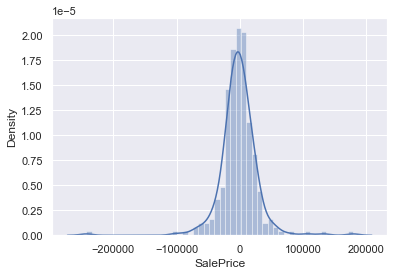

In [246]:
sns.distplot(y_test-pred)

<AxesSubplot:xlabel='SalePrice'>

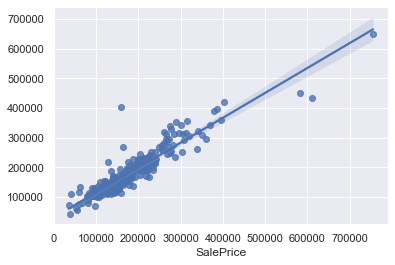

In [247]:
sns.regplot(y_test,pred)

accuracy increased from 84 to 86%

In [245]:
#saving the model
import pickle
file=open('housing.pkl','wb')
pickle.dump(gbr,file)

model is saved

predicting on the test dataset 

In [248]:
columns = x.columns

In [250]:
test_dt_y=pd.DataFrame()
for col in columns:
    test_dt_y[col]=test_dt[col]

In [255]:
test_dt_y

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,HouseStyle,OverallQual,OverallCond,YearBuilt,RoofStyle,RoofMatl,Exterior1st,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,Heating,CentralAir,Electrical,2ndFlrSF,LowQualFinSF,BsmtHalfBath,KitchenAbvGr,Functional,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageQual,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1168,20,3,86.0,14157,1,1,0,1,0,0,22,2,2,2,9,5,17,3,1,12,4,200.0,2,4,2,4,1,2,1249,6,0,673,1,1,5,0,0,0,1,6,1,2,2005.0,0,5,2,178,51,0,0,0,0,4,0,7,15,8,4
1169,120,3,NA,5814,1,1,0,3,1,0,22,2,2,2,8,5,38,1,1,6,3,0.0,2,4,1,4,0,2,1036,6,0,184,1,1,5,0,0,0,1,6,1,0,1984.0,2,5,2,63,0,0,0,0,0,4,0,8,13,0,0
1170,20,3,NA,11838,1,1,3,3,4,0,5,2,2,2,8,5,21,3,1,12,3,0.0,2,4,2,4,0,6,0,6,0,1753,1,1,5,0,0,0,1,6,1,5,2001.0,2,5,2,202,151,0,0,0,0,4,0,6,13,8,4
1171,70,3,75.0,12000,1,1,3,0,4,0,6,2,2,5,7,7,81,1,1,8,3,0.0,3,4,1,4,4,5,275,6,0,429,1,1,5,704,0,0,1,6,1,2,1941.0,3,5,2,0,0,0,0,0,0,4,0,7,13,8,4
1172,60,3,86.0,14598,1,1,0,3,1,0,21,1,2,5,6,5,15,1,1,12,4,74.0,2,4,2,4,2,6,0,6,0,894,1,1,5,1039,0,0,1,6,1,2,2007.0,0,5,2,100,18,0,0,0,0,4,0,1,14,8,4
1173,180,4,21.0,1936,1,1,3,3,4,0,10,2,2,6,4,6,52,1,1,5,3,0.0,3,4,1,4,0,1,131,2,499,0,1,1,5,0,0,0,1,6,0,3,NA,1,3,2,0,0,0,0,0,0,2,0,12,15,8,4
1174,180,4,35.0,3675,1,1,3,3,4,0,7,2,2,7,5,5,17,1,1,12,1,80.0,3,4,2,4,1,2,547,6,0,0,1,1,5,0,0,0,1,6,0,3,2005.0,0,5,2,0,28,0,0,0,0,4,0,5,16,8,4
1175,20,3,107.0,13891,1,1,3,3,4,0,16,2,2,2,8,5,15,3,1,12,4,436.0,2,4,2,4,1,2,1400,6,0,310,1,1,5,0,0,0,1,6,1,2,2007.0,2,5,2,0,102,0,0,0,0,4,0,1,14,6,5
1176,80,3,NA,12800,1,1,3,2,4,1,20,2,2,7,7,5,33,1,1,13,1,145.0,2,4,2,4,1,2,1518,6,0,0,1,1,5,0,0,1,1,6,1,5,1989.0,0,5,2,80,0,0,0,396,0,4,0,8,13,8,4
1177,120,4,32.0,4500,1,1,3,3,2,0,11,2,2,2,6,5,24,3,1,12,1,320.0,3,4,2,4,4,2,866,6,0,338,1,1,5,0,0,0,1,6,0,3,1998.0,0,5,2,0,247,0,0,0,0,4,0,6,13,8,4


In [253]:
file=open('housing.pkl','rb')
prediction = pickle.load(file)
prediction

GradientBoostingRegressor(min_samples_leaf=2, n_estimators=700)

In [256]:
test_dt_y.replace('NA',0,inplace=True)

In [258]:
predicted_price=prediction.predict(test_dt_y)

In [259]:
test_data['Predicted price']=predicted_price

In [260]:
test_data.to_csv('Test data prediction.csv')

In [261]:
train_data.to_csv('Train data cleaned.csv')

In [262]:
train_data.to_excel('Train data cleaned.xlsx')